# Initialization

In [17]:
import mxnet as mx
import numpy as np
import os
import time
import datetime

# Setting logger
import logging

ts = time.time()
timestamp = datetime.datetime.fromtimestamp(ts).strftime('%m-%d-%H-%M')

logfile = 'data/logs/warper-{}.log'.format(timestamp)

logging.basicConfig(filename=logfile,level=logging.INFO)

def log_print(*args):
    print(" ".join(map(str, args)))
    logging.info(" ".join(map(str, args)))
    
log_print("logfile {} created and opened".format(logfile))


logfile data/logs/warper-07-18-17-21.log created and opened


### Configurable Params

In [21]:
# Parameters and configurables

context= mx.gpu()

#training hyperparameters:
batch_size = 4
num_epoch = 800
learning_rate = 0.0001
opt_name = 'adam'
eval_metric = 'mae' #mean absolute error (manhattan) or mean squared error (euclidean)

#training_inputs
generate_new_csvs = True
redownload_annotations = False
training_folder_names = ['PHI-PIT_6m-8m', 'NYR-BOS_22m12s-22m30s', \
                         'DET-NSH_0h7m45s-0h8m5s', 'DET-NSH_0h10m12s-0h10m17s']
# ignore these if generating new csvs
train_csv_filename = 'train_data_07-18-16-49.csv' 
test_csv_filename = 'test_data_07-18-16-49.csv'
local_train_dir = os.path.join(os.path.dirname((os.getcwd())), 's3_training_data')
recalculate_mean_color = False
mean_color = np.array([0.6274094, 0.61885411, 0.61518264], dtype=float)

#model initializatiin
use_imagenet = True
path_to_weights = 'data/mx_ckpts/warper-07-11-18-37-epoch'
weights_epoch = 800
target_shape = (3, 300, 300)
input_data_name = 'data'
output_data_name = 'reg_out'

#Analysis
visualize = False
logfile_to_analyze = ''
# logfile_to_analyze = 'warper-07-10-20-24' # If we want to analyze a previous train run, specify here
if not logfile_to_analyze: #if we aren't specifying a past train run to analyze
    logfile_to_analyze = logfile #analyze current run
else: #complete the path
    logfile_to_analyze = 'data/logs/{}.log'.format(logfile_to_analyze)

log_print('Training params/configs set')
if use_imagenet:
    log_print('Using imagenet weights')
else:
    log_print('Using {} weights'.format(path_to_weights))

log_print("Analysis will be conducted on {}".format(logfile_to_analyze))

Training params/configs set
Using imagenet weights
Analysis will be conducted on data/logs/warper-07-18-17-21.log


### Setting up data sets

In [22]:
# Download S3 dataset
from utils.file_manager import FileManager
fm = FileManager('bsivisiondata')
fm.download_dir('', local=local_train_dir, force_redownload_jsons=redownload_annotations)
log_print("S3 dataset downloaded")

Downloaded 120/120 files from BUF-EDM_1h53m26s-1h53m46s/annotations/
Redownloaded 120 files
Downloaded 0/120 files from BUF-EDM_1h53m26s-1h53m46s/frames/
Redownloaded 0 files
Downloaded 0/0 files from BUF-EDM_1h53m26s-1h53m46s/
Redownloaded 0 files
Downloaded 149/150 files from DET-NSH_0h10m12s-0h10m17s/annotations/
Redownloaded 149 files
Downloaded 0/149 files from DET-NSH_0h10m12s-0h10m17s/frames/
Redownloaded 0 files
Downloaded 0/0 files from DET-NSH_0h10m12s-0h10m17s/
Redownloaded 0 files
Downloaded 596/597 files from DET-NSH_0h7m45s-0h8m5s/annotations/
Redownloaded 596 files
Downloaded 0/600 files from DET-NSH_0h7m45s-0h8m5s/frames/
Redownloaded 0 files
Downloaded 0/0 files from DET-NSH_0h7m45s-0h8m5s/
Redownloaded 0 files
Downloaded 184/184 files from NYR-BOS_22m12s-22m30s/annotations/
Redownloaded 184 files
Downloaded 0/285 files from NYR-BOS_22m12s-22m30s/frames/
Redownloaded 0 files
Downloaded 0/1 files from NYR-BOS_22m12s-22m30s/
Redownloaded 0 files
Downloaded 161/162 files 

In [23]:
if generate_new_csvs:
    log_print("Generating new train/test csvs")
    from generate_training_files import *
    data = []
    for folder in training_folder_names:
        training_folder = os.path.join(local_train_dir, folder)
        tmp = extract_training_data(None, training_folder)
        data += tmp
        log_print("{} labelled files in {}".format(len(tmp), folder))

    data_len = len(data)
    train, test = split_train_test_data(data, 0.7, div_by=batch_size)
    train_csv_filename = 'csvs/train_data_{}.csv'.format(timestamp)
    test_csv_filename = 'csvs/test_data_{}.csv'.format(timestamp)
    write_csv_data_to_file(train_csv_filename, train)
    write_csv_data_to_file(test_csv_filename, test)
    log_print('{} train samples, {} test samples, {} unused'.format(len(train), len(test), data_len - len(train) - len(test)))

Generating new train/test csvs
57 labelled files in PHI-PIT_6m-8m
31 labelled files in NYR-BOS_22m12s-22m30s
13 labelled files in DET-NSH_0h7m45s-0h8m5s
28 labelled files in DET-NSH_0h10m12s-0h10m17s
88 train samples, 40 test samples, 1 unused


In [24]:
train_csv_file = train_csv_filename
eval_csv_file = test_csv_filename

from utils.data_extractor import DataExtractor
data = DataExtractor(local_train_dir)

# imglists are defined labels, framefiles by mxnet image iter.  Flip elements
train_imglist = [[x[1], x[0]] for x in data.get_imglist(train_csv_file)]
eval_imglist = [[x[1], x[0]] for x in data.get_imglist(eval_csv_file)]

log_print('IMG Lists created')
log_print("{} train images".format(len(train_imglist)))
log_print("{} eval images".format(len(eval_imglist)))

IMG Lists created
88 train images
40 eval images


In [25]:
# Get mean and std color from frames
# Note, this finds the std dev between the MEAN COLOR (per channel) of each image.
# Does not account for variance within the image
if recalculate_mean_color:
    from matplotlib.image import imread

    mean_color = np.array([0.0, 0.0, 0.0], dtype=np.float32)
    sample_count = 0 
    M2 = np.array([0.0, 0.0, 0.0], dtype=np.float32)

    for im_filename in [x[1] for x in train_imglist + eval_imglist]:
        im = imread(im_filename) #reads in H, W, C order
        x = np.mean(im, axis=(0,1))
        sample_count += 1
        delta = x - mean_color
        mean_color += delta/sample_count
    #     M2 += delta*(x - mean_color)

    # if sample_count >= 2:
    #     std_color = np.sqrt(M2 / (sample_count - 1))
    # else:
    #     std_color = float('nan')

    log_print('Calculated mean/stddev R,G,B vals for dataset')

# if mean_colors are on a 0->1 scale, scale them up to 255
if mean_color[0] < 1:
    mean_color = np.array(255*mean_color, dtype=np.uint8)
log_print('Mean Color (to subtract): ', mean_color)
# log_print('Stddev: ', std_color)

# std_color = float('nan')


Mean Color (to subtract):  [159 157 156]


In [26]:
# Initialize image iterators

path_root = os.getcwd()

aug_list = mx.image.CreateAugmenter(data_shape=target_shape, rand_mirror=False, rand_crop=False, mean=mean_color)
aug_list = [mx.image.ForceResizeAug((target_shape[2], target_shape[1]))] + aug_list # resize is in W, H order
# ordered_augs = mx.image.SequentialAug(aug_list)

train_img_iter = mx.image.ImageIter(batch_size, target_shape, imglist=train_imglist, shuffle=True, \
                                    path_root=path_root, data_name=input_data_name, label_width=9, \
                                    label_name=output_data_name, aug_list=aug_list)
eval_img_iter = mx.image.ImageIter(batch_size, target_shape, imglist=eval_imglist, shuffle=True, \
                                   path_root=path_root, data_name=input_data_name, label_width=9, \
                                   label_name=output_data_name, aug_list=aug_list)

tmat = train_img_iter.next_sample()[0]
emat = eval_img_iter.next_sample()[0]

for aug in aug_list:
    print aug.dumps()
log_print('Initialized image iterators')

["forceresizeaug", {"interp": 2, "size": [300, 300]}]
["centercropaug", {"interp": 2, "size": [300, 300]}]
["castaug", {"type": "float32"}]
["colornormalizeaug", {"std": null, "mean": [159, 157, 156]}]
Initialized image iterators


### Initializing the module

In [30]:
# Get the module
from vistools.inceptionv3 import get_symbol

if opt_name == 'adam':
    opt = mx.optimizer.Adam(learning_rate=learning_rate)

sym = get_symbol(num_outputs=9, output_name=output_data_name)

mod = mx.mod.Module(symbol=sym,
                        context=context,
                        data_names=[input_data_name],
                        label_names=[output_data_name])
log_print("Module initialized")

Module initialized


In [31]:
# Load weights
if use_imagenet:
    # Download imagenet params
    if not os.path.exists('mx_model_zoo/inception_v3/'):
        print('Downloading imagenet params')
        path='http://data.mxnet.io/models/imagenet/'
        dest_dir = os.path.join('mx_model_zoo', 'inception_v3')
        downloaded_files = mx.test_utils.download(path+'inception-v3.tar.gz', dirname=dest_dir)
    log_print("Imagenet downloaded")
    log_print("FRESH TRAINING--from imagenet")
    
    _, arg_params, aux_params = mx.model.load_checkpoint('mx_model_zoo/inception_v3/Inception-7', 1)
    mod.bind(for_training=True, data_shapes=train_img_iter.provide_data, 
             label_shapes=train_img_iter.provide_label)
    mod.init_params(initializer=mx.init.Xavier())
    mod.set_params(arg_params, aux_params, allow_missing=True, allow_extra=True, force_init=True)

else:
    log_print('Using {} weights'.format(path_to_weights))
    log_print('CONTINUED TRAINING from epoch {}'.format(weights_epoch))
    _, arg_params, aux_params = mx.model.load_checkpoint(path_to_weights, weights_epoch)
    mod.bind(for_training=True, data_shapes=train_img_iter.provide_data, 
             label_shapes=train_img_iter.provide_label)
    mod.set_params(arg_params, aux_params, allow_missing=False, allow_extra=False, force_init=True)

log_print("Params loaded")

Imagenet downloaded
FRESH TRAINING--from imagenet


RuntimeError: simple_bind error. Arguments:
data: (4, 3, 300, 300)
reg_out: (4, 9)
[17:33:08] src/storage/storage.cc:123: Compile with USE_CUDA=1 to enable GPU usage

Stack trace returned 10 entries:
[bt] (0) 0   libmxnet.so                         0x0000000109b7e3b4 libmxnet.so + 21428
[bt] (1) 1   libmxnet.so                         0x0000000109b7e16f libmxnet.so + 20847
[bt] (2) 2   libmxnet.so                         0x0000000109b7dde9 libmxnet.so + 19945
[bt] (3) 3   libmxnet.so                         0x000000010b0f87ac MXTVMBridge + 3526252
[bt] (4) 4   libmxnet.so                         0x000000010b0f5a77 MXTVMBridge + 3514679
[bt] (5) 5   libmxnet.so                         0x000000010a455d39 libmxnet.so + 9293113
[bt] (6) 6   libmxnet.so                         0x000000010a455a7d libmxnet.so + 9292413
[bt] (7) 7   libmxnet.so                         0x000000010a455871 libmxnet.so + 9291889
[bt] (8) 8   libmxnet.so                         0x000000010ac4f4af MXNDListFree + 254287
[bt] (9) 9   libmxnet.so                         0x000000010ac45172 MXNDListFree + 212498



In [13]:
# Define callbacks
epochs_per_ckpt = 100
prefix = 'data/mx_ckpts/warper-{}-epoch'.format(timestamp)

checkpointer = mx.callback.do_checkpoint(prefix, epochs_per_ckpt)
batches_per_epoch = len(train_imglist) / batch_size
progress_bar = mx.callback.ProgressBar(total=batches_per_epoch)
log_print('Defined callbacks')

Defined callbacks


### Random model testing


In [14]:
# Test prediction run
iterator = eval_img_iter
iterator.reset()
print next(iterator)
iterator.reset()
for batch in iterator:
    mod.forward(batch, is_train=True)       # compute predictions
    pred = mod.get_outputs()[0].asnumpy()
    y = batch.label[0].asnumpy()
    print "Loss: ", ((y - pred) **2.0).mean()

DataBatch: data shapes: [(4L, 3L, 300L, 300L)] label shapes: [(4L, 9L)]
Loss:  4.232587
Loss:  3.5623338
Loss:  2.5114276
Loss:  2.4360704
Loss:  2.2228143
Loss:  5.4284663
Loss:  6.8793783
Loss:  4.9847283
Loss:  10.560169
Loss:  2.57471


In [15]:
if visualize:
    mx.viz.plot_network(sym)

# Training

In [16]:
# Fit

train_img_iter.reset()

log_print("Batch size={}".format(batch_size))
log_print("Num epochs={}".format(num_epoch))
log_print("Learning rate={}".format(learning_rate))
log_print("Eval metric={}".format(eval_metric))

log_print('Fitting...')

mod.fit(train_img_iter,
            eval_data=eval_img_iter,
            eval_metric=eval_metric,
            num_epoch=num_epoch,
            initializer=mx.init.Xavier(),
            force_init=False,
            optimizer='adam',
            optimizer_params={"learning_rate": learning_rate},
            epoch_end_callback=checkpointer
       )
log_print('{} epochs completed'.format(num_epoch))


Batch size=4
Num epochs=800
Learning rate=0.0001
Eval metric=mae
Fitting...


/Users/campbellweaver/Documents/BSI/lib/python2.7/site-packages/mxnet/module/base_module.py:488: UserWarning: Parameters already initialized and force_init=False. init_params call ignored.
  allow_missing=allow_missing, force_init=force_init)


KeyboardInterrupt: 

# Analysis


In [17]:
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 200

Analyzing logfile  data/logs/warper-07-11-18-37.log
Minimum train-mae: 0.005793 at epoch 670
Minimum val-mae: 0.492267 at epoch 270


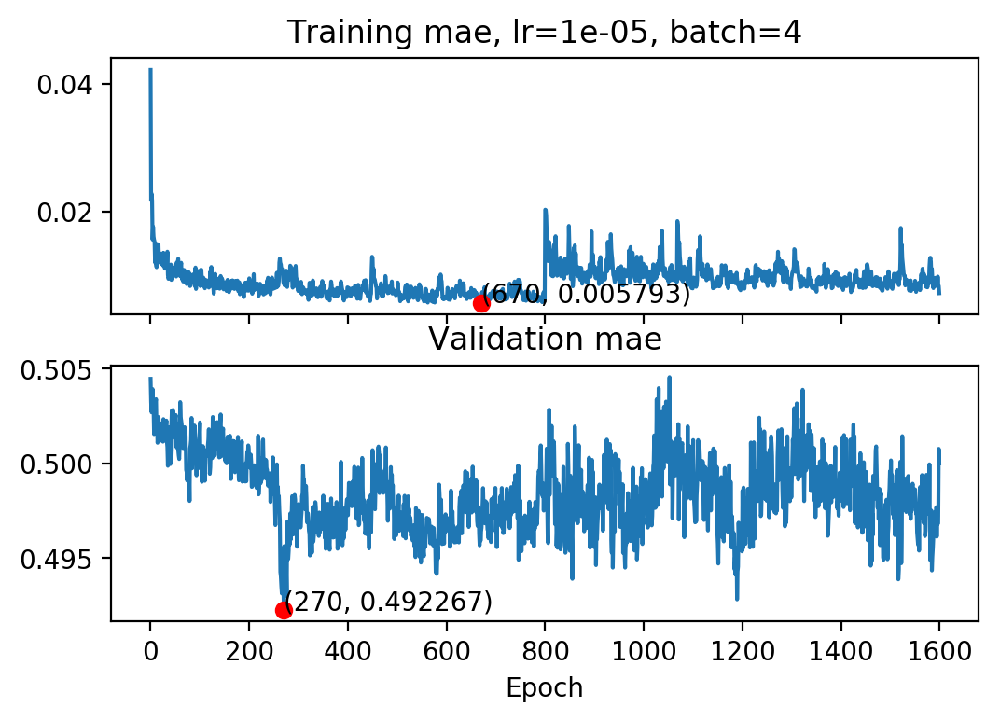

In [46]:
# Analyzing train run

log_print("Analyzing logfile ", logfile_to_analyze)

train_loss = []
val_loss = []
with open(logfile_to_analyze, 'r') as f:
    for line in f:
        if 'Epoch[' in line:
            if 'Train-'+eval_metric in line:
                train_loss.append(float(line.split('=')[1]))
            elif 'Validation-'+eval_metric in line:
                val_loss.append(float(line.split('=')[1]))

import matplotlib.pyplot as plt

f, ax = plt.subplots(2, sharex=True)
ax[0].plot(range(len(train_loss)), train_loss)
ax[0].set_title('Training '+eval_metric+', lr={}, batch={}'.format(learning_rate, batch_size))
ax[1].plot(range(len(val_loss)), val_loss)
ax[1].set_title('Validation '+eval_metric)
ax[1].set_xlabel('Epoch')

min_train_loss, train_epoch = min((val, idx) for (idx, val) in enumerate(train_loss))
log_print('Minimum train-{}: {} at epoch {}'.format(eval_metric, min_train_loss, train_epoch))
min_val_loss, val_epoch = min((val, idx) for (idx, val) in enumerate(val_loss))
log_print('Minimum val-{}: {} at epoch {}'.format(eval_metric, min_val_loss, val_epoch))

ax[0].plot([train_epoch], [min_train_loss], c='r', marker='o')
ax[0].annotate('(%s, %s)' % (train_epoch, min_train_loss), xy=(train_epoch, min_train_loss), textcoords='data')
ax[1].plot([val_epoch], [min_val_loss], c='r', marker='o')
ax[1].annotate('(%s, %s)' % (val_epoch, min_val_loss), xy=(val_epoch, min_val_loss), textcoords='data')


warper_filename = os.path.basename(logfile_to_analyze).split('.')[0] + '.png'
plt.savefig('data/train_plots/' + warper_filename)




[ 0.40154755  0.76781404  1.0277369   0.58451283  2.69336343 -0.75663531
  0.04385911  1.4262135   1.        ]
[ 0.44749659  0.41125184  0.95310473  0.55223727  2.20180511 -0.5803529
  0.14650916  0.99618673  1.00621653]
[-0.04594904  0.3565622   0.07463217  0.03227556  0.49155831 -0.17628241
 -0.10265005  0.43002677 -0.00621653]


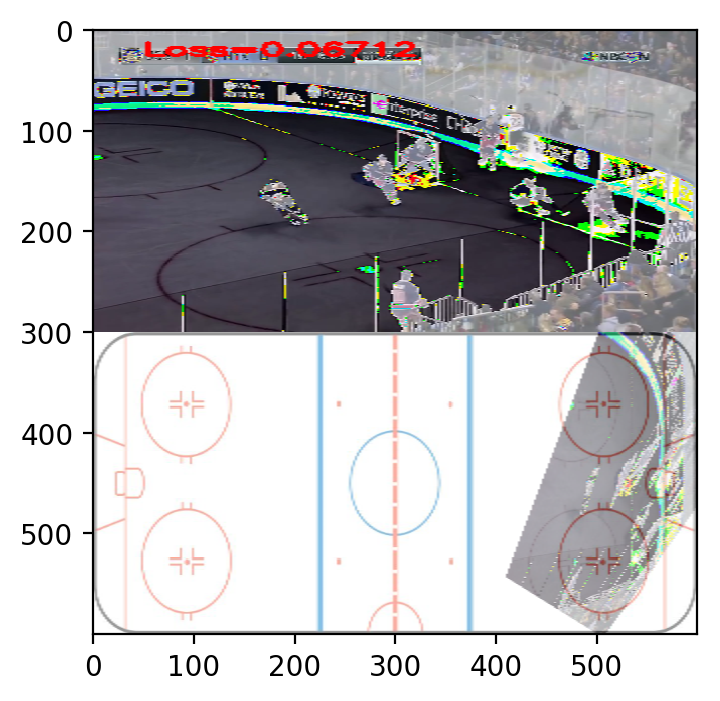

data/images_val/warper-07-10-20-24-b00-loss0.067118.png
[ 0.56774181  0.91799653  1.09530687  0.81103271  4.76872587 -2.36808276
 -0.17649892  2.47446847  1.        ]
[ 0.72837222  1.09555936  1.11039734  0.97612476  5.22991467 -2.59120536
 -0.13488154  2.81481171  0.98420125]
[-0.1606304  -0.17756283 -0.01509047 -0.16509205 -0.46118879  0.2231226
 -0.04161738 -0.34034324  0.01579875]


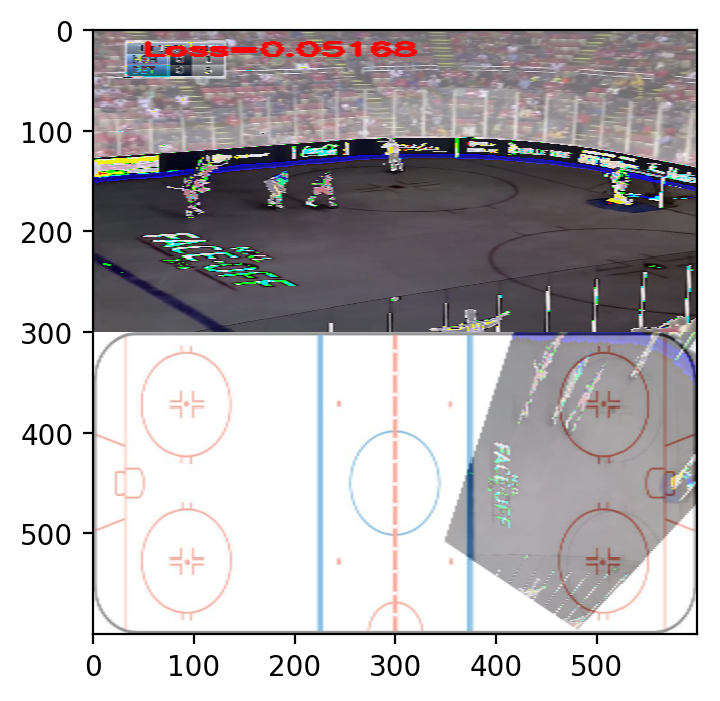

data/images_val/warper-07-10-20-24-b01-loss0.051679.png
[ 0.31933483  0.57206094 -0.30470148 -0.3031812   2.34680581 -0.3786867
  0.38794869  1.50766349  1.        ]
[ 0.34665671  0.62839335 -0.29394519 -0.30098492  2.52206421 -0.41802663
  0.37973678  1.60641098  1.01844478]
[-0.02732188 -0.05633241 -0.01075628 -0.00219628 -0.1752584   0.03933993
  0.00821191 -0.09874749 -0.01844478]


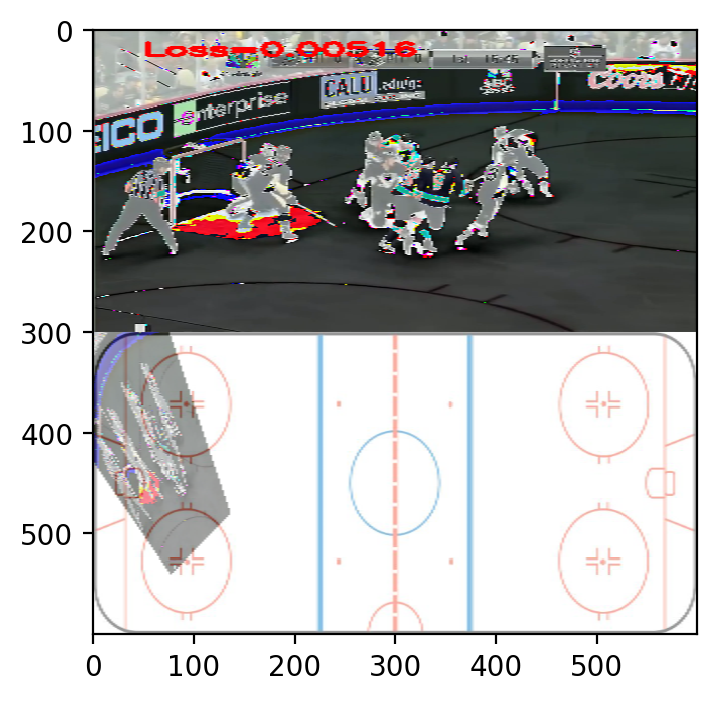

data/images_val/warper-07-10-20-24-b02-loss0.005162.png
[ 0.04917318  0.74042386  0.97022229  0.32625601  2.54437351 -0.814089
 -0.34659201  1.34599638  1.        ]
[ 0.50578201  0.40640193  0.91282129  0.52628839  2.31316137 -0.65988004
  0.1592254   0.98899662  1.01318717]
[-0.45660883  0.33402193  0.057401   -0.20003238  0.23121214 -0.15420896
 -0.50581741  0.35699975 -0.01318717]


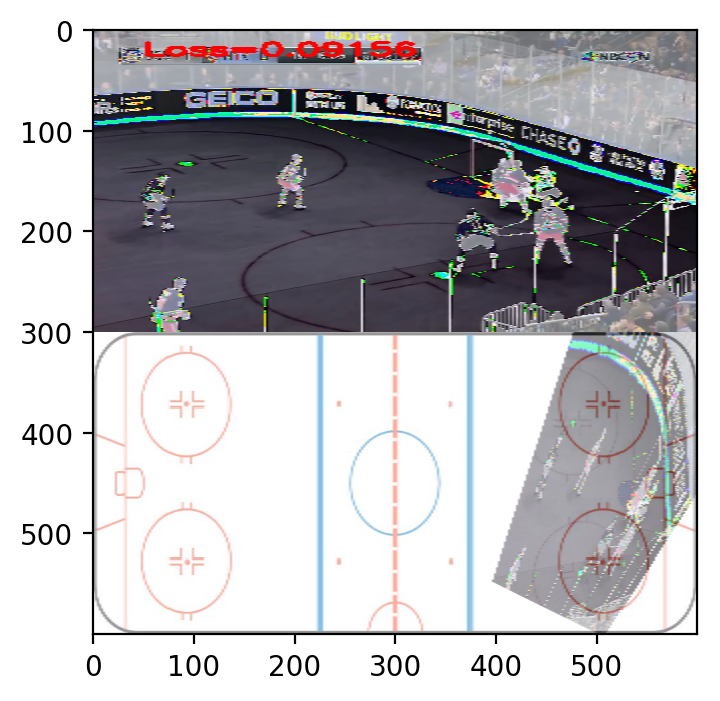

data/images_val/warper-07-10-20-24-b03-loss0.091565.png
[ 0.37356818  1.06486869  1.00632453  0.60082048  3.06450343 -0.77315289
 -0.06630768  1.82604802  1.        ]
[ 0.38526726  0.26673651  1.01096869  0.54866701  1.94294012 -0.44314367
  0.09279073  0.7711069   1.01815188]
[-0.01169908  0.79813218 -0.00464416  0.05215347  1.12156332 -0.33000922
 -0.15909842  1.05494118 -0.01815188]


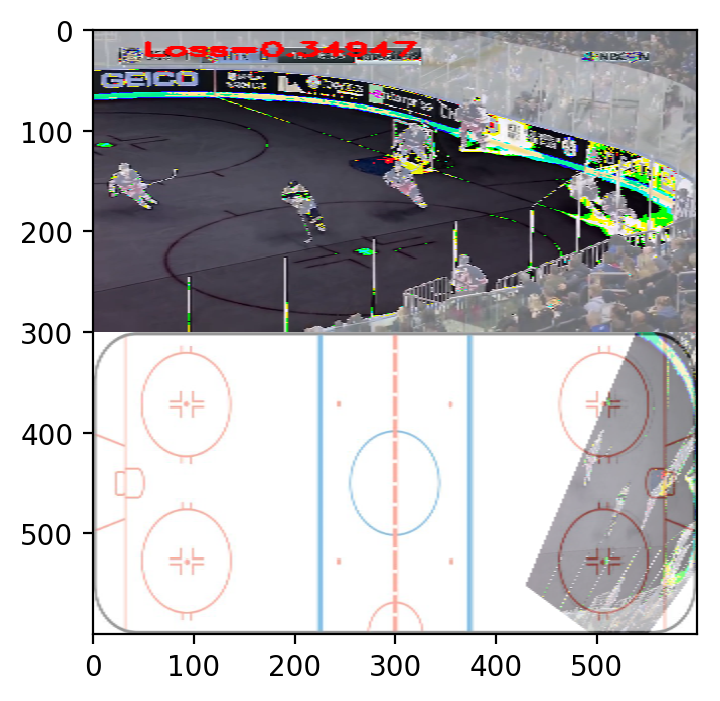

data/images_val/warper-07-10-20-24-b04-loss0.349472.png
[ 0.41116363  0.77246267 -0.49760127 -0.61874795  3.04743075 -0.2972165
  0.43283057  1.93709517  1.        ]
[ 0.56343484  1.04172707 -0.60027653 -0.63771558  4.24637222 -0.60901976
  0.7169891   2.81448722  1.02503991]
[-0.15227121 -0.2692644   0.10267526  0.01896763 -1.19894147  0.31180325
 -0.28415853 -0.87739205 -0.02503991]


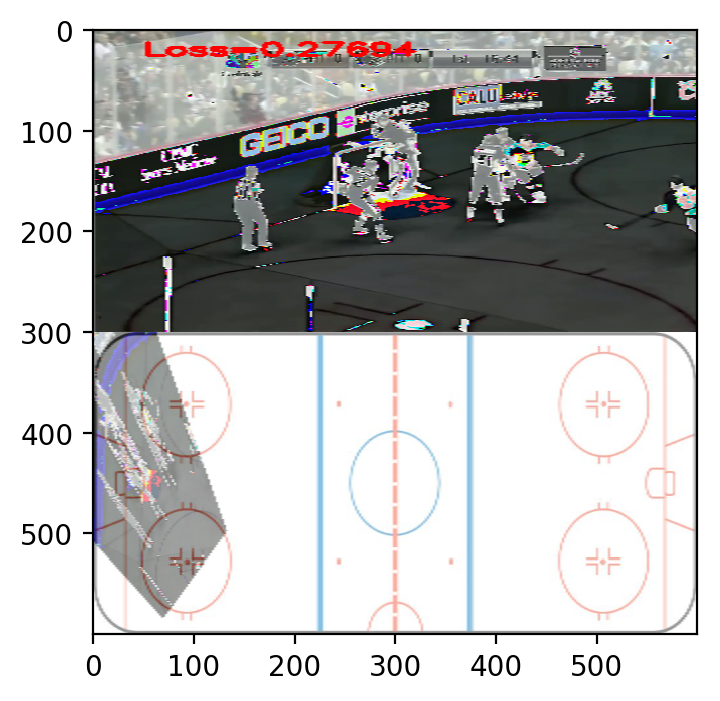

data/images_val/warper-07-10-20-24-b05-loss0.276940.png
[  1.52214766   2.97859931  -2.02626705  -1.43146491  12.12537861
  -2.12078524   2.4331553    9.24866009   1.        ]
[ 0.47175115  0.93457961 -0.48973221 -0.69051641  3.80721188 -0.3344506
  0.36423084  2.4639585   1.02706885]
[ 1.05039644  2.0440197  -1.53653479 -0.7409485   8.31816673 -1.78633463
  2.06892443  6.78470135 -0.02706885]


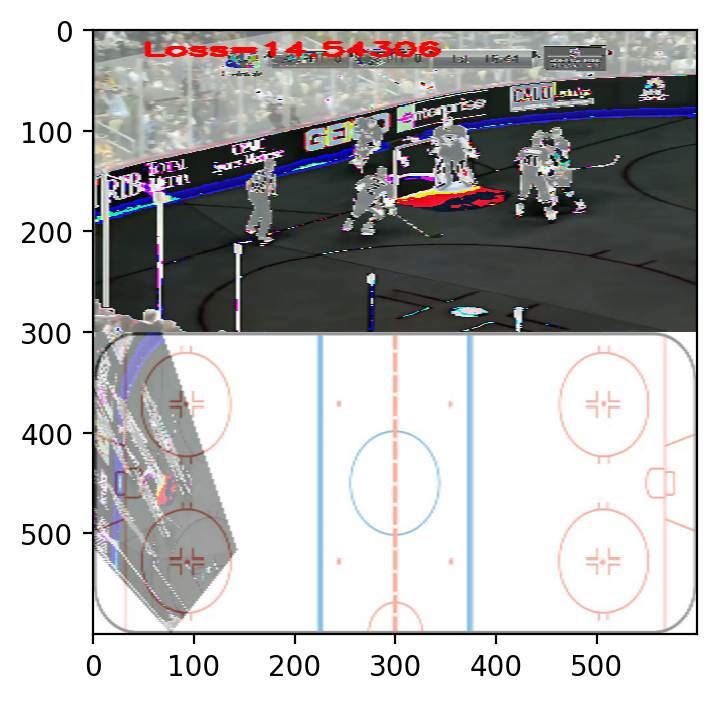

data/images_val/warper-07-10-20-24-b06-loss14.543060.png
[ 0.52908289  0.77428228  0.21713233  0.02029511  3.01227736 -0.65438092
  0.01856661  1.53981674  1.        ]
[ 0.59956497  0.84869432  0.29935846  0.16921869  3.46543622 -0.92162478
  0.10990973  1.75162017  0.98181862]
[-0.07048208 -0.07441205 -0.08222613 -0.14892358 -0.45315886  0.26724386
 -0.09134312 -0.21180344  0.01818138]


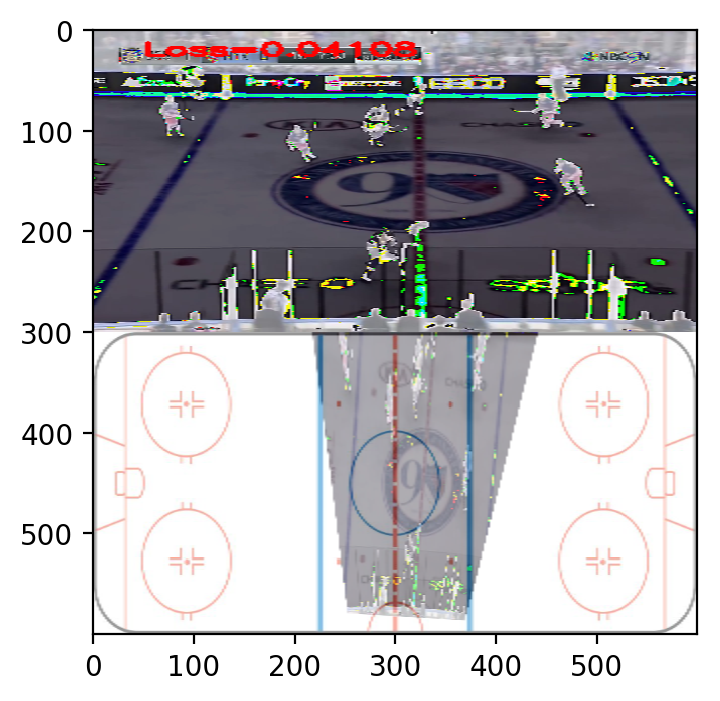

data/images_val/warper-07-10-20-24-b07-loss0.041083.png
[ 0.40207192  0.87962341  0.98286372  0.58141041  2.92150044 -0.63559318
  0.02001605  1.6212002   1.        ]
[ 0.38695991  0.25467226  0.93564224  0.53619945  2.01466584 -0.41820729
  0.05383416  0.79479551  1.01383066]
[ 0.01511201  0.62495112  0.04722148  0.04521096  0.9068346  -0.21738589
 -0.03381811  0.82640469 -0.01383066]


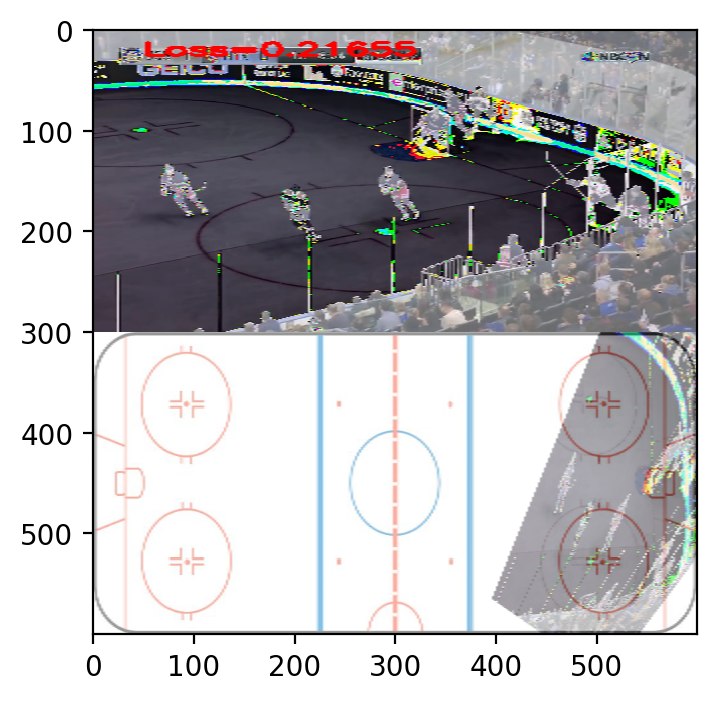

data/images_val/warper-07-10-20-24-b10-loss0.216550.png
[ 0.56040621  0.85418099  0.23317918  0.06513881  3.3623929  -0.80674231
  0.01785769  1.70763481  1.        ]
[ 0.5611459   0.83773744  0.28848952  0.16429044  3.40257645 -0.88306284
  0.07621663  1.73118293  0.96980184]
[-0.00073969  0.01644355 -0.05531034 -0.09915163 -0.04018354  0.07632053
 -0.05835894 -0.02354813  0.03019816]


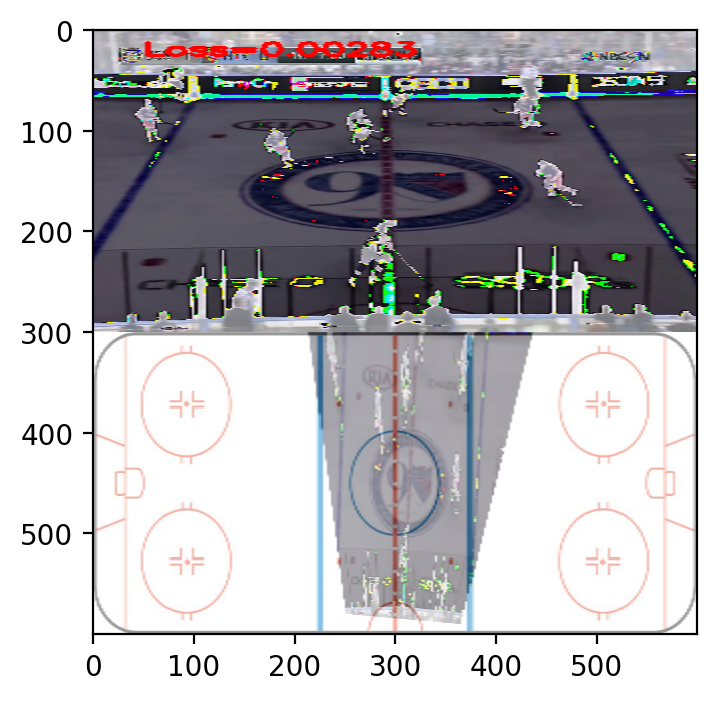

data/images_val/warper-07-10-20-24-b11-loss0.002830.png
[  2.69043493   4.881073    -2.89202046  -1.88162255  19.59932518
  -2.11943269   4.90375042  12.62403584   1.        ]
[ 0.4397226   0.87307763 -0.44789818 -0.76771957  3.55511522 -0.01662479
  0.2022488   2.0609014   1.01195967]
[  2.25071239e+00   4.00799561e+00  -2.44412231e+00  -1.11390305e+00
   1.60442104e+01  -2.10280800e+00   4.70150185e+00   1.05631342e+01
  -1.19596720e-02]


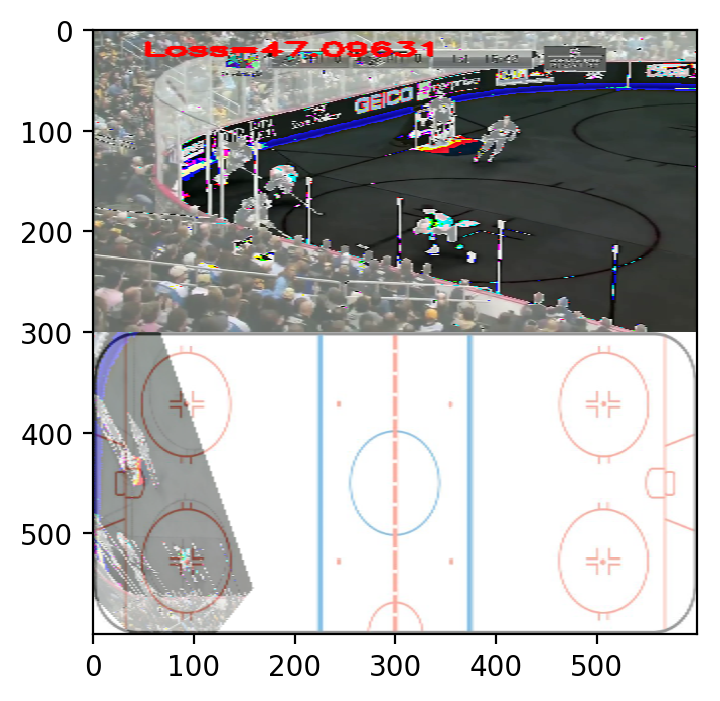

data/images_val/warper-07-10-20-24-b12-loss47.096313.png
[ 0.32247481  0.56641388 -0.29826137 -0.31855634  2.32990289 -0.39402089
  0.36120752  1.44573545  1.        ]
[ 0.37193659  0.67297274 -0.30704933 -0.31261235  2.73129368 -0.50374627
  0.42569214  1.7534976   1.04880679]
[-0.04946178 -0.10655886  0.00878796 -0.00594398 -0.40139079  0.10972539
 -0.06448463 -0.30776215 -0.04880679]


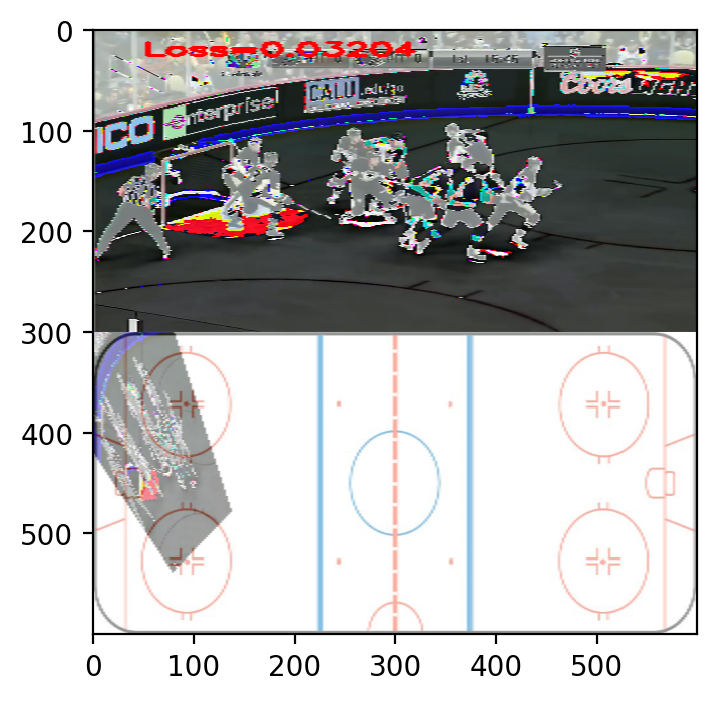

data/images_val/warper-07-10-20-24-b13-loss0.032036.png
[ 0.46625093  0.87504131 -0.55052924 -0.60676712  3.48603225 -0.45556623
  0.54893643  2.31080222  1.        ]
[ 0.53591877  1.04071712 -0.61887193 -0.63030076  4.18353844 -0.61030036
  0.64834648  2.85749125  1.02811575]
[-0.06966785 -0.16567582  0.06834269  0.02353364 -0.69750619  0.15473413
 -0.09941006 -0.54668903 -0.02811575]


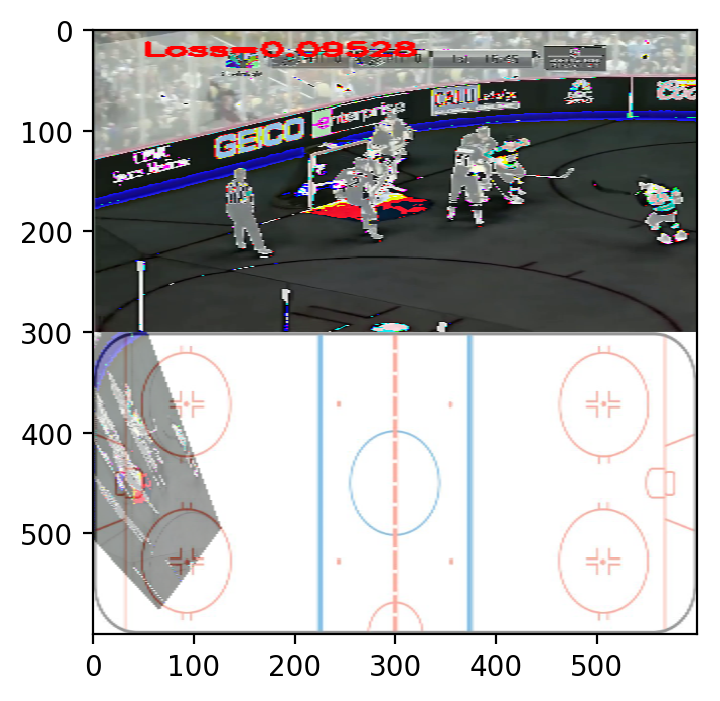

data/images_val/warper-07-10-20-24-b14-loss0.095281.png
[ 0.71955097  1.24989581 -0.78523868 -0.38574493  5.15880966 -1.18583453
  1.45300508  3.33391547  1.        ]
[ 0.66547406  1.23554659 -0.74333596 -0.5272212   5.12367725 -1.067518
  1.12483382  3.61443615  1.00625181]
[ 0.05407691  0.01434922 -0.04190272  0.14147627  0.03513241 -0.11831653
  0.32817125 -0.28052068 -0.00625181]


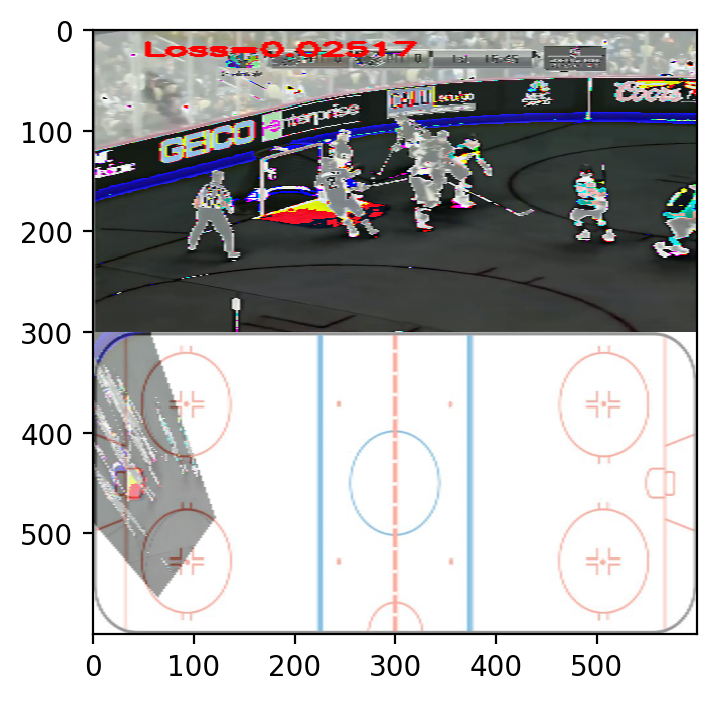

data/images_val/warper-07-10-20-24-b15-loss0.025174.png
[ 0.54002255  1.26046753  0.63665503  0.44261682  5.04066229 -2.36704659
 -0.37432182  2.90467501  1.        ]
[ 0.67774403  1.1480211   0.55703211  0.4001894   4.82325029 -2.18197298
 -0.15332052  2.69103146  1.01065826]
[-0.13772148  0.11244643  0.07962292  0.04242742  0.21741199 -0.18507361
 -0.2210013   0.21364355 -0.01065826]


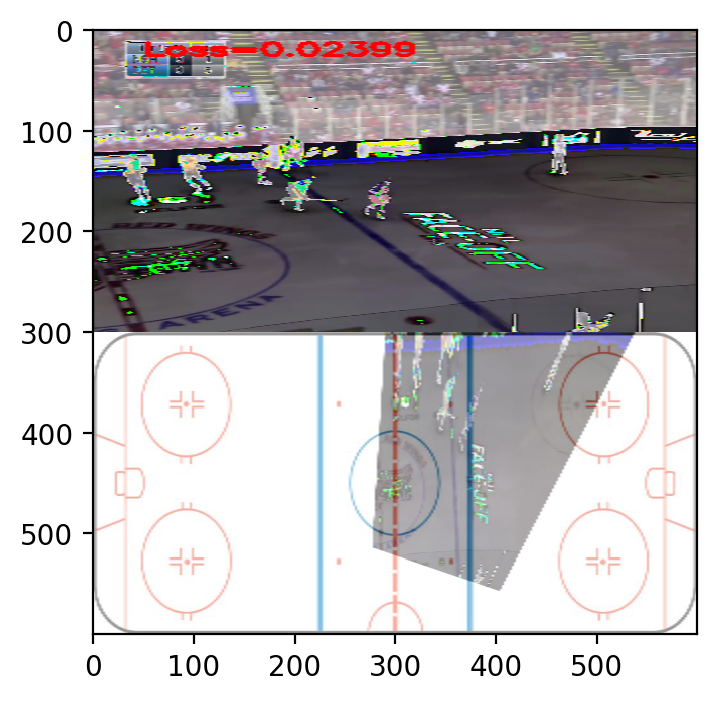

data/images_val/warper-07-10-20-24-b16-loss0.023986.png
[ 0.43852141  0.93041247 -0.54079515 -0.73114413  3.73404121 -0.07618655
  0.36247942  2.17724037  1.        ]
[ 0.60156345  1.28831244 -0.63623905 -0.7318567   5.33318424 -0.37635854
  0.62126511  3.39245105  1.04195297]
[ -1.63042039e-01  -3.57899964e-01   9.54439044e-02   7.12573528e-04
  -1.59914303e+00   3.00171971e-01  -2.58785695e-01  -1.21521068e+00
  -4.19529676e-02]


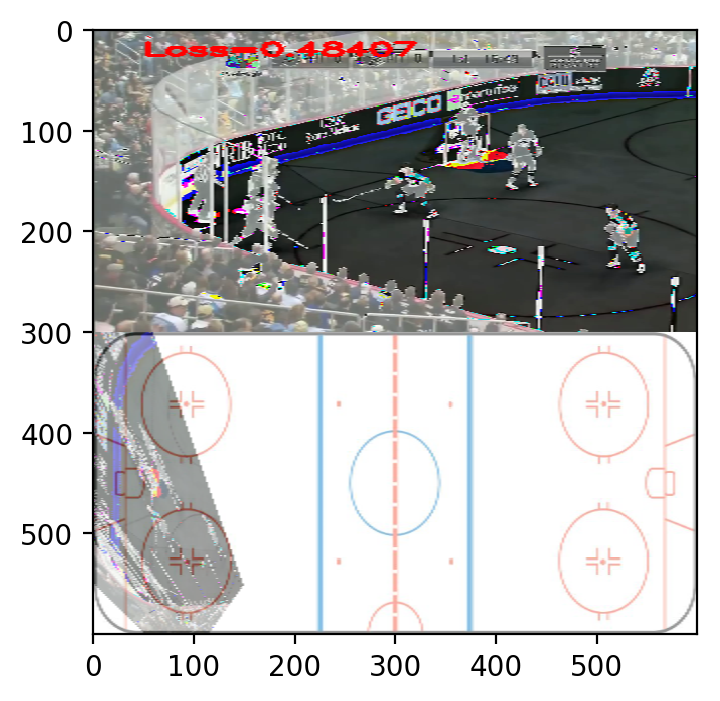

data/images_val/warper-07-10-20-24-b17-loss0.484068.png
[ 0.40436417  0.78947389 -0.51291007 -0.60750437  3.08394003 -0.30626401
  0.21236309  2.04325819  1.        ]
[ 0.55179954  1.02159238 -0.55848491 -0.63606048  4.25266314 -0.59845322
  0.62571979  2.80692816  1.0422858 ]
[-0.14743537 -0.23211849  0.04557484  0.02855611 -1.16872311  0.29218921
 -0.41335669 -0.76366997 -0.0422858 ]


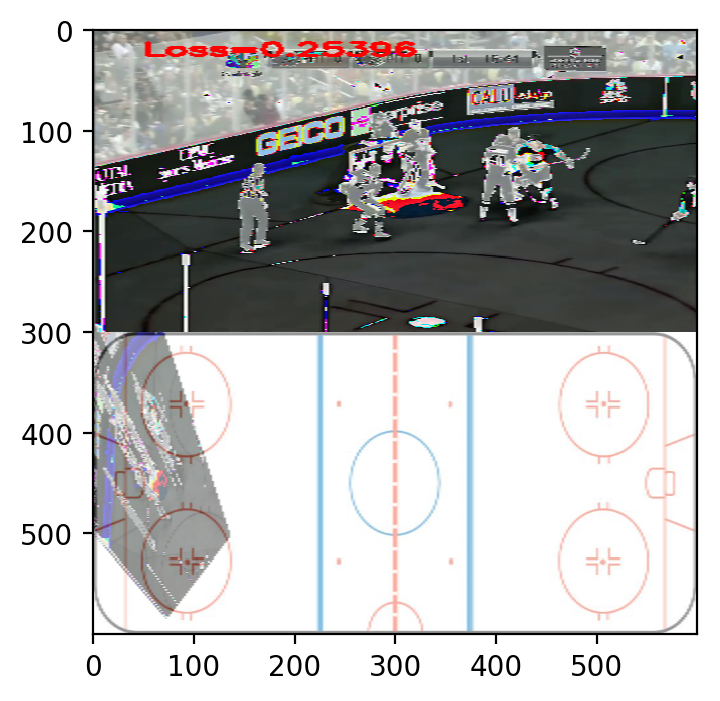

data/images_val/warper-07-10-20-24-b20-loss0.253960.png
[ 0.52415371  0.73976028  0.41311866  0.22482441  3.09372497 -0.79239643
  0.0044151   1.51612473  1.        ]
[ 0.66968358  0.71269751  0.40344524  0.28161189  3.23591042 -0.83924603
  0.18824477  1.52646697  0.96623546]
[-0.14552987  0.02706277  0.00967342 -0.05678748 -0.14218545  0.04684961
 -0.18382968 -0.01034224  0.03376454]


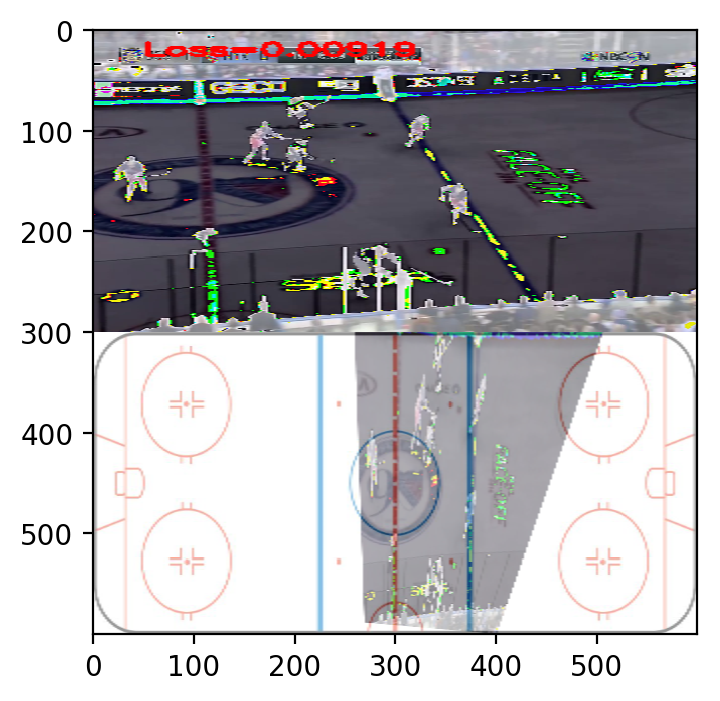

data/images_val/warper-07-10-20-24-b21-loss0.009187.png
[ 0.79859942  1.53861928 -0.71616852 -0.87981033  6.21835041 -0.67055094
  0.73037785  3.81545305  1.        ]
[ 0.62017769  1.12714541 -0.34713814 -0.52537251  4.44682646 -0.57317233
  0.43340915  2.71273875  1.01691747]
[ 0.17842174  0.41147387 -0.36903039 -0.35443783  1.77152395 -0.09737861
  0.2969687   1.1027143  -0.01691747]


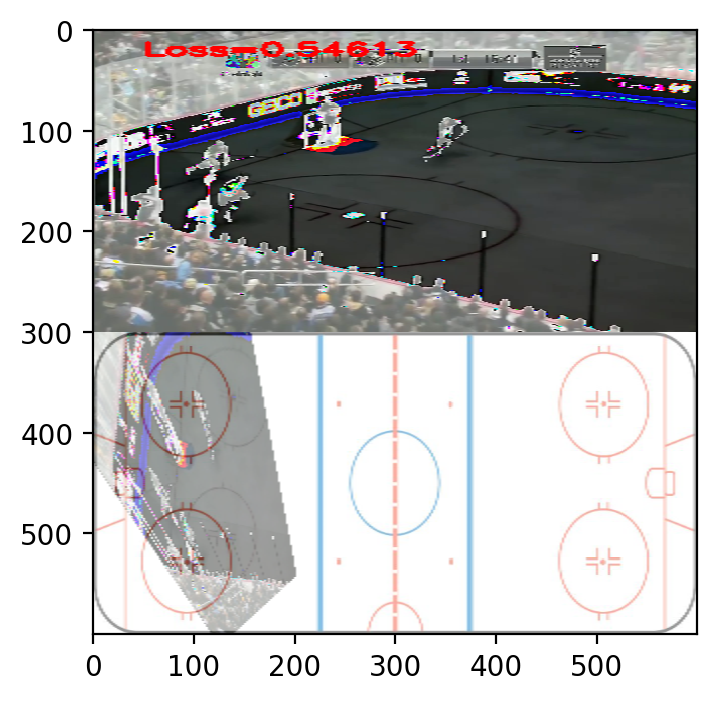

data/images_val/warper-07-10-20-24-b22-loss0.546132.png
[ 0.71212786  1.29672384  0.05318579 -0.13713868  4.80981588 -1.79606712
 -0.09260178  2.89766765  1.        ]
[ 0.65910518  1.05977857  0.1455543   0.07401089  4.30174065 -1.77128887
 -0.02043262  2.3828001   0.9927479 ]
[ 0.05302268  0.23694527 -0.09236851 -0.21114957  0.50807524 -0.02477825
 -0.07216915  0.51486754  0.0072521 ]


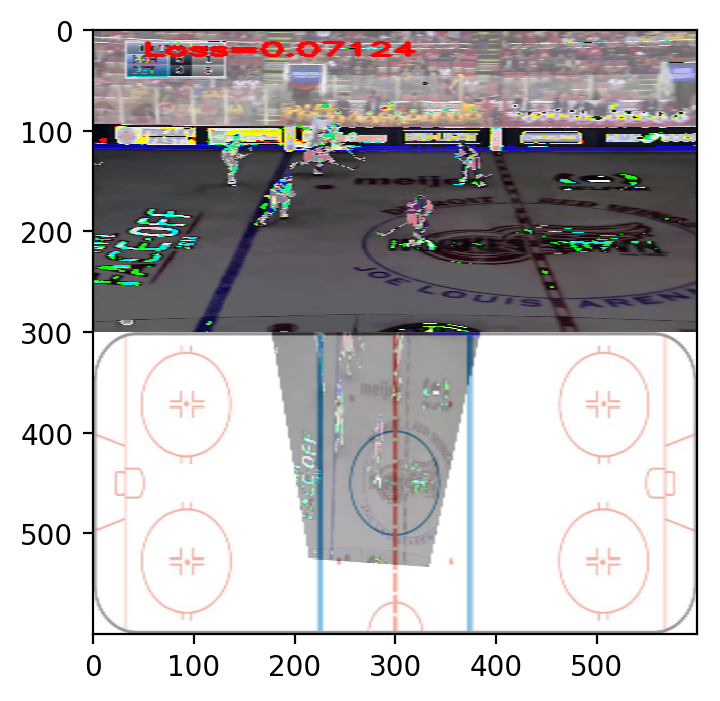

data/images_val/warper-07-10-20-24-b23-loss0.071242.png
[ 0.26694164  0.56396294 -0.3516891  -0.55429769  2.22295523 -0.02248435
  0.0181114   1.30900276  1.        ]
[ 0.47281721  0.90972853 -0.47901976 -0.6999768   3.73931575 -0.32091701
  0.3290177   2.43102622  1.02919269]
[-0.20587558 -0.34576559  0.12733066  0.14567912 -1.51636052  0.29843265
 -0.31090629 -1.12202346 -0.02919269]


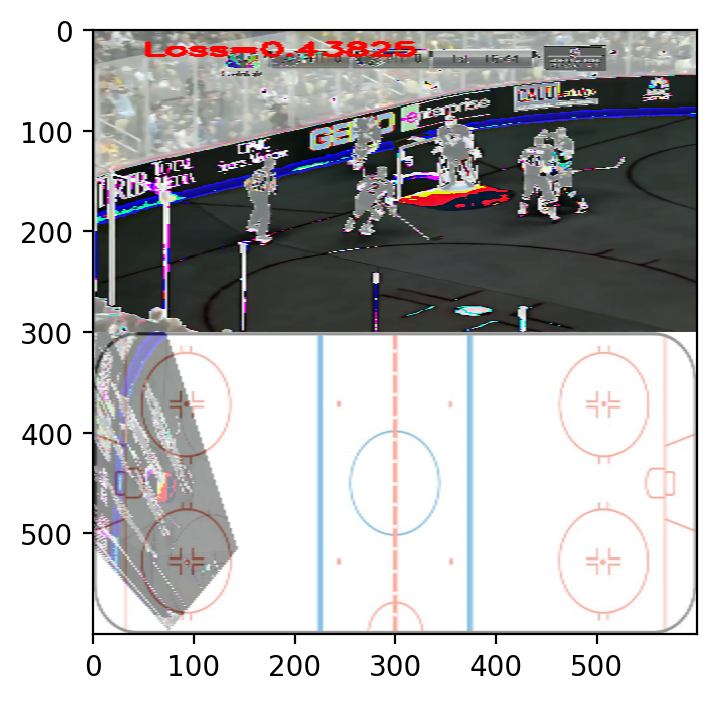

data/images_val/warper-07-10-20-24-b24-loss0.438249.png
[ 0.36281022  0.6515215  -0.35042334 -0.30799544  2.64799881 -0.47995523
  0.42799488  1.79750204  1.        ]
[ 0.34853739  0.62018847 -0.29317001 -0.31445372  2.58450556 -0.44463623
  0.37194583  1.65878284  1.01509786]
[ 0.01427284  0.03133303 -0.05725333  0.00645828  0.06349325 -0.035319
  0.05604905  0.1387192  -0.01509786]


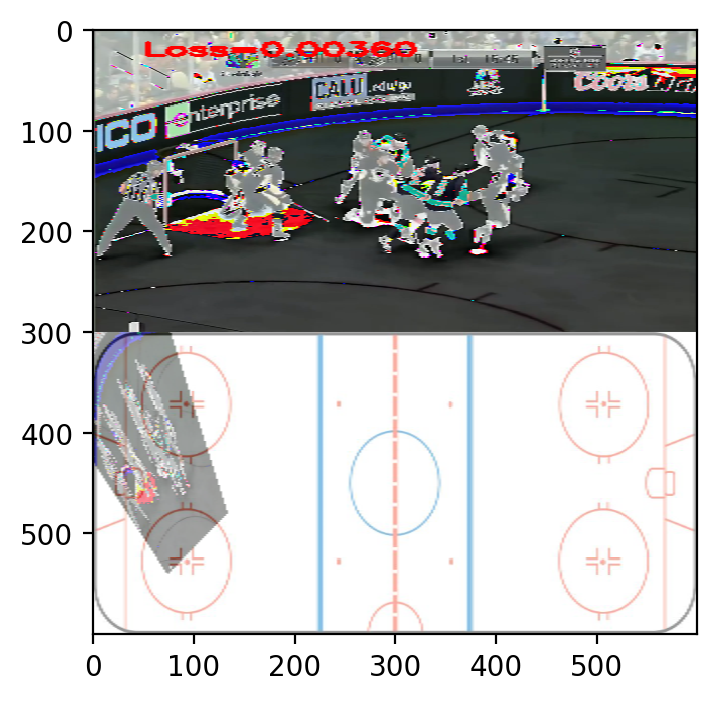

data/images_val/warper-07-10-20-24-b25-loss0.003600.png
[ 0.4544473   0.59098291  0.5943532   0.32779217  2.757967   -0.73185945
 -0.08780596  1.2637459   1.        ]
[ 0.47717857  0.56616282  0.61708307  0.36175537  2.70391178 -0.72803926
 -0.00397023  1.19736135  1.00661397]
[-0.02273127  0.02482009 -0.02272987 -0.0339632   0.05405521 -0.00382018
 -0.08383573  0.06638455 -0.00661397]


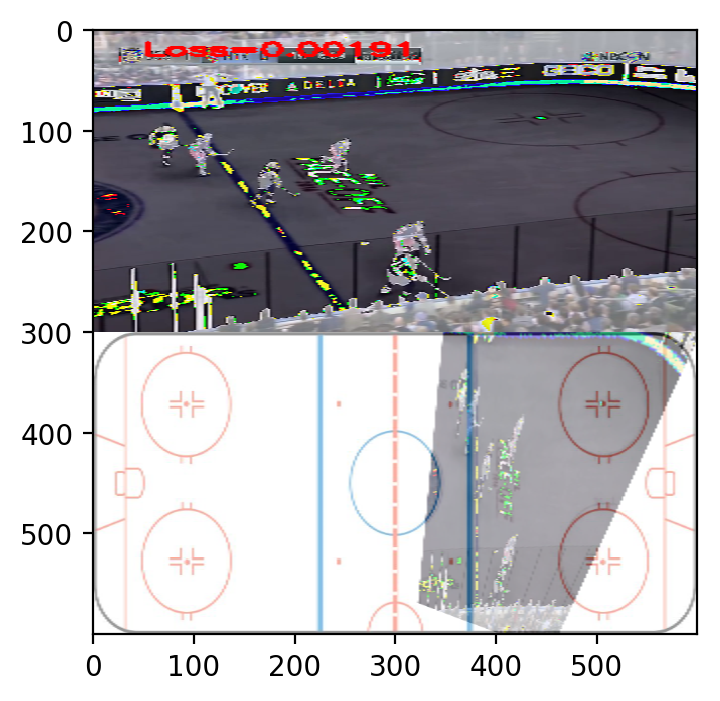

data/images_val/warper-07-10-20-24-b26-loss0.001913.png
[ 0.49695161  0.9340992  -0.60034543 -0.64065874  3.74120069 -0.49025023
  0.63834977  2.48413801  1.        ]
[ 0.55522591  1.05174184 -0.64006668 -0.63788247  4.22055006 -0.62364542
  0.80203104  2.80008388  1.02092302]
[-0.0582743  -0.11764264  0.03972125 -0.00277627 -0.47934937  0.1333952
 -0.16368127 -0.31594586 -0.02092302]


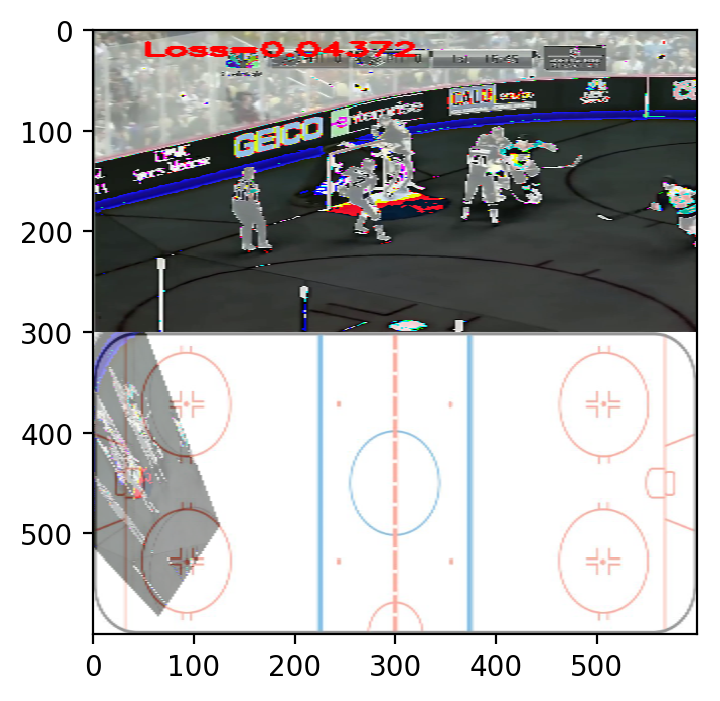

data/images_val/warper-07-10-20-24-b27-loss0.043716.png


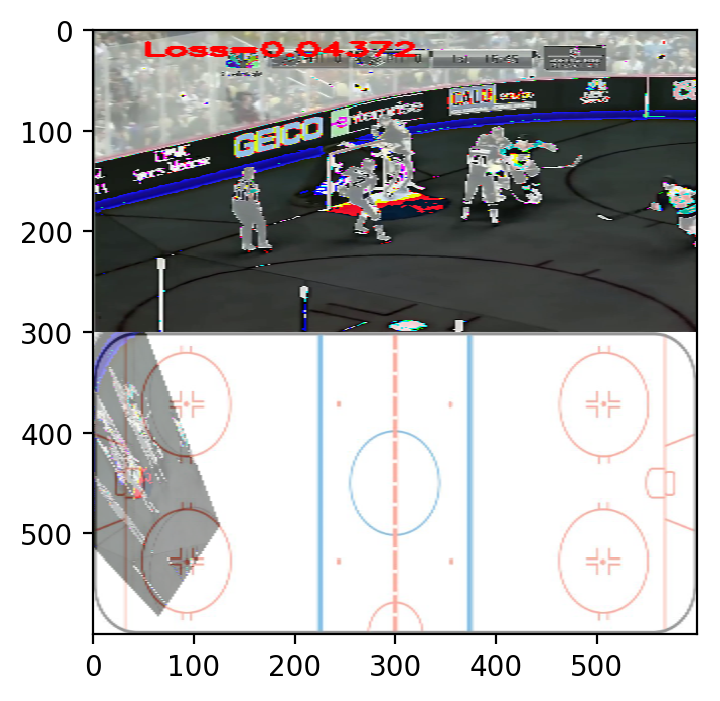

In [19]:
# Testing on hold-out data
# Using all images

from utils.display import Display

mod.bind(for_training=False, data_shapes=train_img_iter.provide_data, 
         label_shapes=train_img_iter.provide_label)

d = Display()
eval_img_iter.reset()
for i, batch in enumerate(eval_img_iter):
    mod.forward(batch, is_train=False)       # compute predictions
    batch_pred = mod.get_outputs()[0]
    for j, pred in enumerate(batch_pred):
        pred_unshaped = np.array(pred.asnumpy(), dtype=np.float32)
        pred = pred_unshaped.reshape((3,3))
        im = np.array(np.moveaxis(batch.data[0][j].asnumpy(), 0, -1), dtype=np.uint8)

        y = batch.label[0][j].asnumpy()
        print y
        print pred_unshaped
        print(y - pred_unshaped)
        loss = ((y - pred_unshaped) **2.0).mean()
        im = im.copy()
        d.put_text(im, 'Loss={:.5f}'.format(loss), text_size=.6, text_loc=(25,25), color=(255,0,0), thickness=2)
        
        warp = d.get_warp_overlay(im, pred, dsize=(300,300))

        stacked_ims = d.get_vstacked(im, warp, dsize=(600,600))
        d.display_image(stacked_ims)
        weights_prefix = "-".join(os.path.basename(path_to_weights).split('-')[:-1])
        filename = 'data/images_val/{}-b{}{}-loss{:5f}.png'.format(weights_prefix, i, j, loss)
        print filename
        d.save_image(filename, stacked_ims)

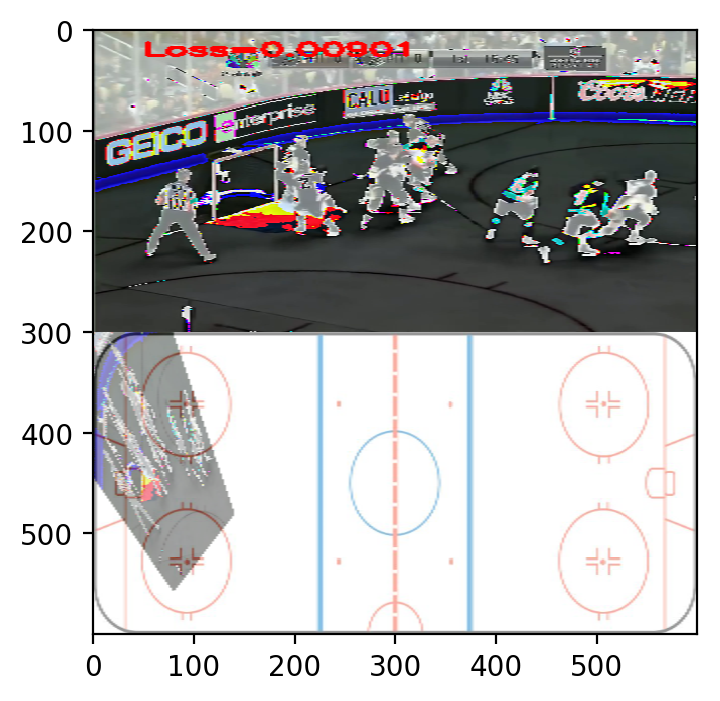

Saved image to data/images_train/warper-07-10-20-24-b0-loss0_00901.png


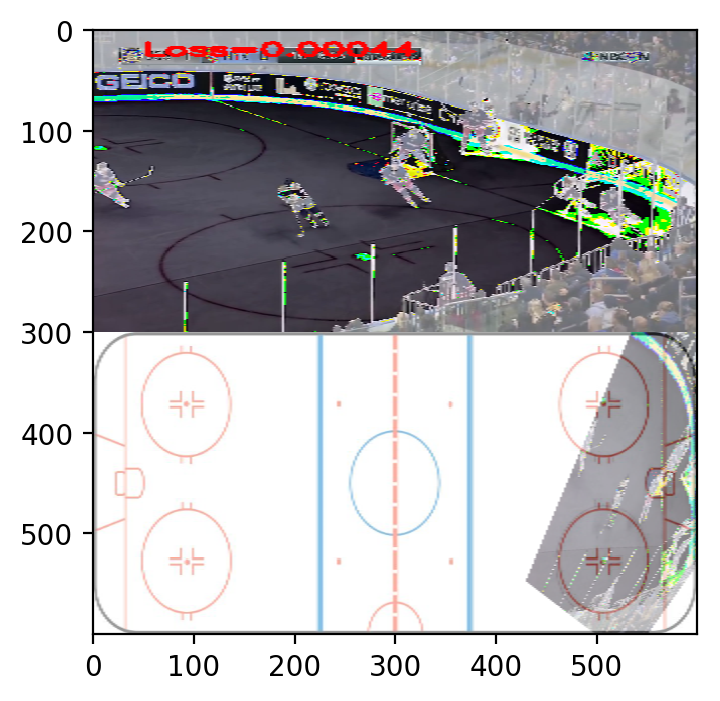

Saved image to data/images_train/warper-07-10-20-24-b1-loss0_00044.png


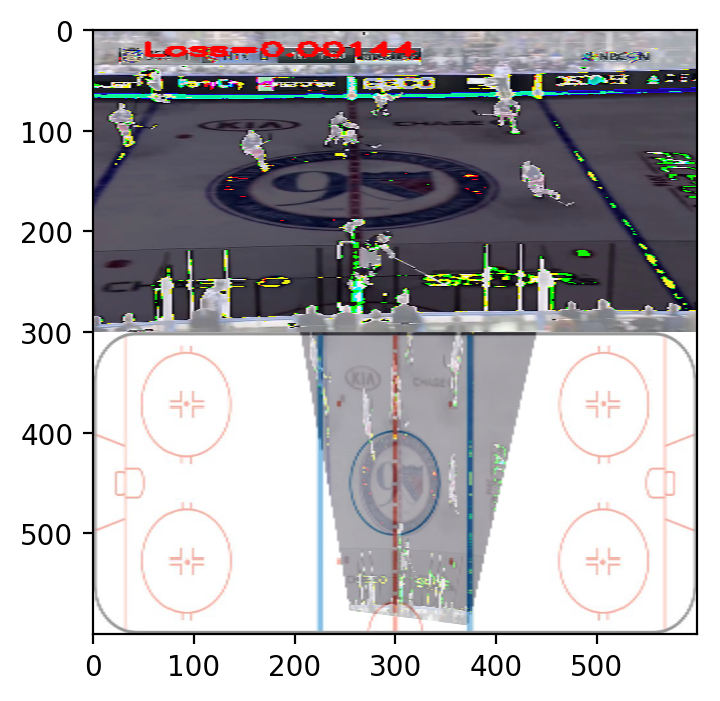

Saved image to data/images_train/warper-07-10-20-24-b2-loss0_00144.png


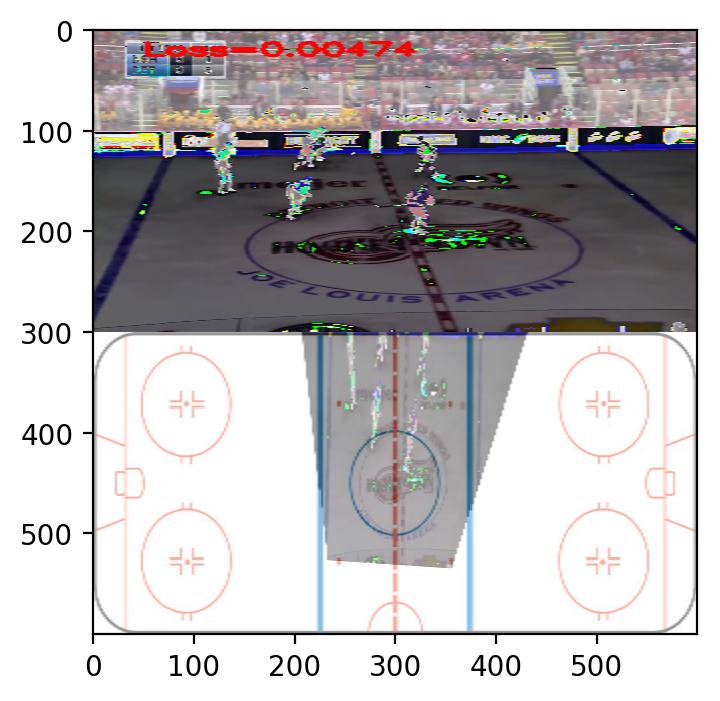

Saved image to data/images_train/warper-07-10-20-24-b3-loss0_00474.png


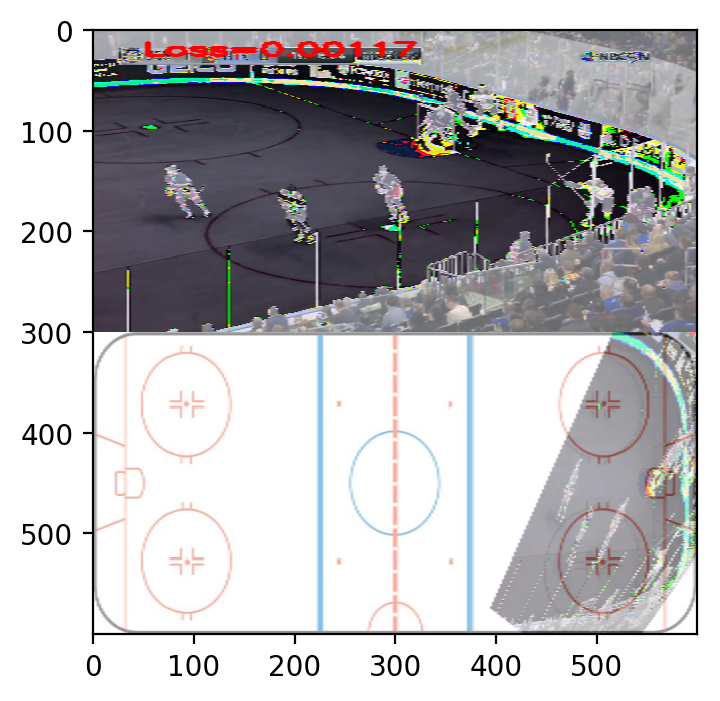

Saved image to data/images_train/warper-07-10-20-24-b4-loss0_00117.png


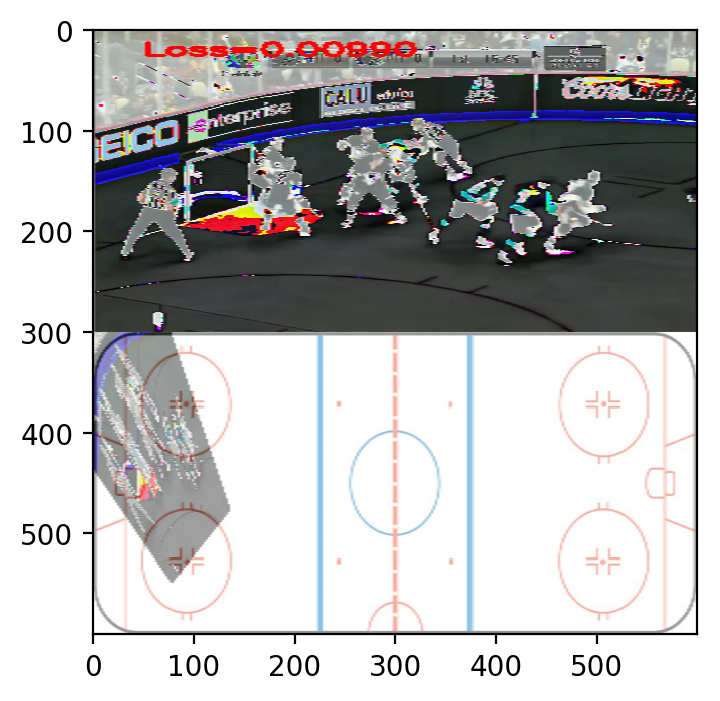

Saved image to data/images_train/warper-07-10-20-24-b5-loss0_00990.png


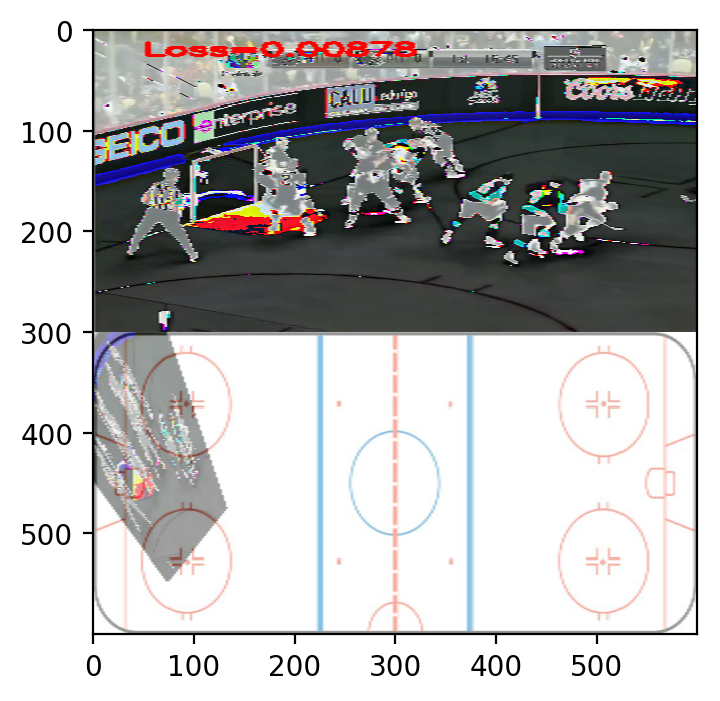

Saved image to data/images_train/warper-07-10-20-24-b6-loss0_00878.png


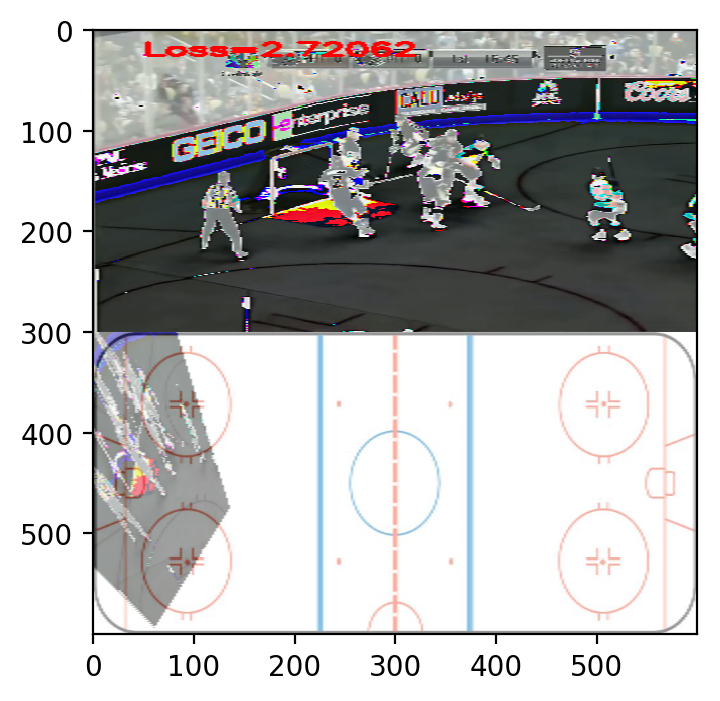

Saved image to data/images_train/warper-07-10-20-24-b7-loss2_72062.png


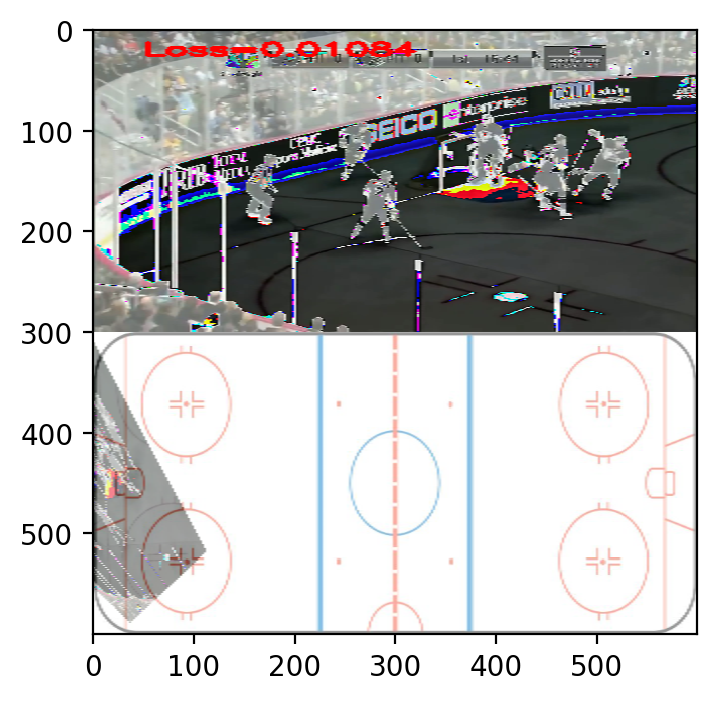

Saved image to data/images_train/warper-07-10-20-24-b8-loss0_01084.png


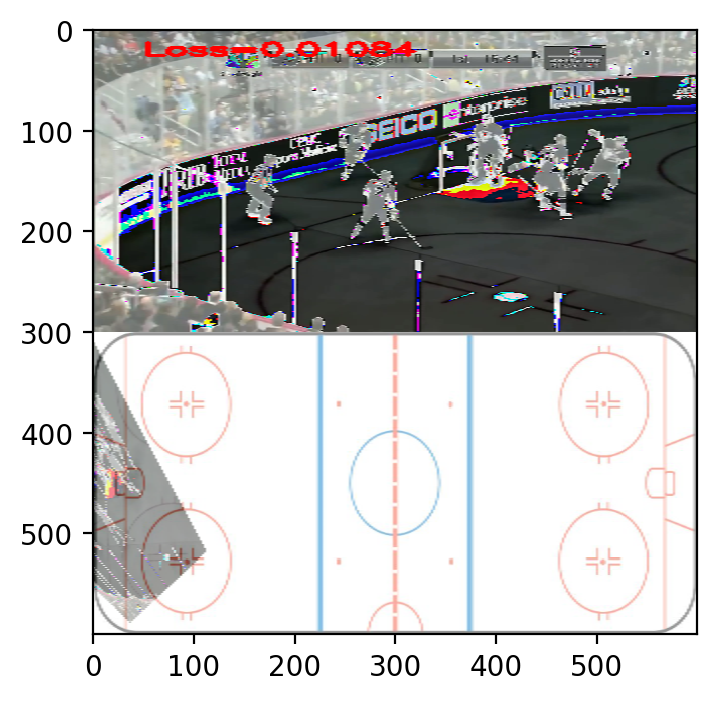

In [20]:
# Testing on train data
# Sampling one image from each batch

from utils.display import Display


mod.bind(for_training=False, data_shapes=train_img_iter.provide_data, 
         label_shapes=train_img_iter.provide_label)

d = Display()

train_img_iter.reset()
for i, batch in enumerate(train_img_iter):
    mod.forward(batch, is_train=False)       # compute predictions
    pred_unshaped = np.array(mod.get_outputs()[0][0].asnumpy(), dtype=np.float32)
    pred = pred_unshaped.reshape((3,3))
    im = np.array(np.moveaxis(batch.data[0][0].asnumpy(), 0, -1), dtype=np.uint8)
    
    y = batch.label[0][0].asnumpy()
    loss = ((y - pred_unshaped) **2.0).mean()
    im = im.copy()
    d.put_text(im, 'Loss={:.5f}'.format(loss), text_size=.6, text_loc=(25,25), color=(255,0,0), thickness=2)
    
    warp = d.get_warp_overlay(im, pred, dsize=(300,300))
    
    stacked_ims = d.get_vstacked(im, warp, dsize=(600,600))
    d.display_image(stacked_ims)
    weights_prefix = "-".join(os.path.basename(path_to_weights).split('-')[:-1])
    filename = 'data/images_train/{}-b{}-loss{:.5f}.png'.format(weights_prefix, i, loss).replace('.', '_', 1)
    d.save_image(filename, stacked_ims)
    log_print("Saved image to {}".format(filename))